# Innit

## Import

In [1]:
import pandas as pd

import re
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

# from langchain.llms import Ollama
# from langchain.prompts import PromptTemplate
# from langchain.chains import LLMChain

from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from nltk.util import ngrams

import matplotlib.pyplot as plt
from wordcloud import WordCloud

from collections import Counter

## Functions

In [2]:
# Initialize the Sastrawi stemmer and stopword remover
stemmer_factory = StemmerFactory()
stemmer = stemmer_factory.create_stemmer()

stopword_factory = StopWordRemoverFactory()
stopwords = stopword_factory.get_stop_words()
    
def clean_text(text):
    # Convert the text to lowercase
    text = text.lower()

    # Remove emoticons
    text = re.sub(r':\)|;\)|:-\)|\(-:|:\'\(|:\(|:-\(|:O|8\)|:\*|>:O|:\-\/|\^\^|:D|:P|:S|:\|', '', str(text))

    # Remove emojis using regex
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)  # This removes non-ASCII characters (like emojis)

    # Remove special characters (including new lines) and symbols
    text = re.sub(r'[^A-Za-z0-9\s]', ' ', text)

    # Remove extra spaces (including new lines)
    text = re.sub(r'\s+', ' ', text).strip()

    #Remove number
    text = re.sub(r'\d+', '', str(text))

    # Remove stopwords
    text_words = text.split()
    text_words = [word for word in text_words if word not in stopwords]

    # Remove words with less than 4 characters
    text_words = [word for word in text_words if len(word) > 2]

    # Apply stemming
    text = ' '.join([stemmer.stem(word) for word in text_words])

    return text

# def generate_summary(text):
#     ollama_model = Ollama(model="aya") 
#     system_prompt = f"Anda adalah seorang ahli analis sentimen.\n\nContext: {text}.\n\nBerikan skor antara 1-5 "
#     prompt_template = PromptTemplate(input_variables=[], template=system_prompt)
#     llm_chain = LLMChain(llm=ollama_model, prompt=prompt_template)
#     response = llm_chain.run({})
#     return response

# Function to generate word clouds for unigrams and bigrams
def generate_wordclouds(df, column):
    unigram_vectorizer = CountVectorizer(ngram_range=(1, 1), stop_words='english')
    bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')

    # Group by Rating
    for rating in df['Rating'].unique():
        comments = df[df['Rating'] == rating][column]

        # Unigram analysis
        unigram_matrix = unigram_vectorizer.fit_transform(comments)
        unigram_freq = unigram_matrix.sum(axis=0).A1
        unigram_terms = unigram_vectorizer.get_feature_names_out()
        unigram_counts = dict(zip(unigram_terms, unigram_freq))

        # Bigram analysis
        bigram_matrix = bigram_vectorizer.fit_transform(comments)
        bigram_freq = bigram_matrix.sum(axis=0).A1
        bigram_terms = bigram_vectorizer.get_feature_names_out()
        bigram_counts = dict(zip(bigram_terms, bigram_freq))

        # Create word cloud for unigrams
        unigram_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(unigram_counts)
        plt.figure(figsize=(10, 5))
        plt.title(f"Unigram Word Cloud for Rating {rating}")
        plt.imshow(unigram_wordcloud, interpolation="bilinear")
        plt.axis('off')
        plt.show()

        # Create word cloud for bigrams
        bigram_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(bigram_counts)
        plt.figure(figsize=(10, 5))
        plt.title(f"Bigram Word Cloud for Rating {rating}")
        plt.imshow(bigram_wordcloud, interpolation="bilinear")
        plt.axis('off')
        plt.show()

def count_bigrams(text_series, n_most_common=10):
    # Use CountVectorizer to extract bigrams
    bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')
    bigram_matrix = bigram_vectorizer.fit_transform(text_series)
    bigram_freq = bigram_matrix.sum(axis=0).A1
    bigram_terms = bigram_vectorizer.get_feature_names_out()
    bigram_counts = dict(zip(bigram_terms, bigram_freq))

    # Get the most common bigrams
    most_common_bigrams = Counter(bigram_counts).most_common(n_most_common)

    return most_common_bigrams

def count_unigrams(text_series, n_most_common=10):
    unigram_vectorizer = CountVectorizer(ngram_range=(1, 1), stop_words='english')
    unigram_matrix = unigram_vectorizer.fit_transform(text_series)
    unigram_freq = unigram_matrix.sum(axis=0).A1
    unigram_terms = unigram_vectorizer.get_feature_names_out()
    unigram_counts = dict(zip(unigram_terms, unigram_freq))

    most_common_unigrams = Counter(unigram_counts).most_common(n_most_common)
    
    return most_common_unigrams

In [15]:
def analyze_comment(data=str):
    df = pd.read_csv(data)
    df = df.dropna()
    cleaned_comments = []
    for comment in df['Comment']:
        cleaned_comments.append(clean_text(comment))

    df['cleaned_comments'] = cleaned_comments
    df

    df = df.drop_duplicates(subset=['cleaned_comments'])

    generate_wordclouds(df, 'cleaned_comments')

    print("=========== Unigram Analysis ==============")

    for rating in range(1,6):
        print(f"\nfor rating: {rating}")
        most_common_unigrams = count_unigrams(df[df['Rating']==rating]['cleaned_comments'].astype(str))

        # Display the most common bigrams and their counts
        for unigrams, count in most_common_unigrams :
            print(f'{unigrams}: {count} occurrences')
    
    print("\n============ Bigram Analysis ==============")

    for rating in range(1,6):
        print(f"\nfor rating: {rating}")
        most_common_bigrams = count_bigrams(df[df['Rating']==rating]['cleaned_comments'].astype(str))

        # Display the most common bigrams and their counts
        for bigrams, count in most_common_bigrams :
            print(f'{bigrams}: {count} occurrences')

# MSGlow Comments

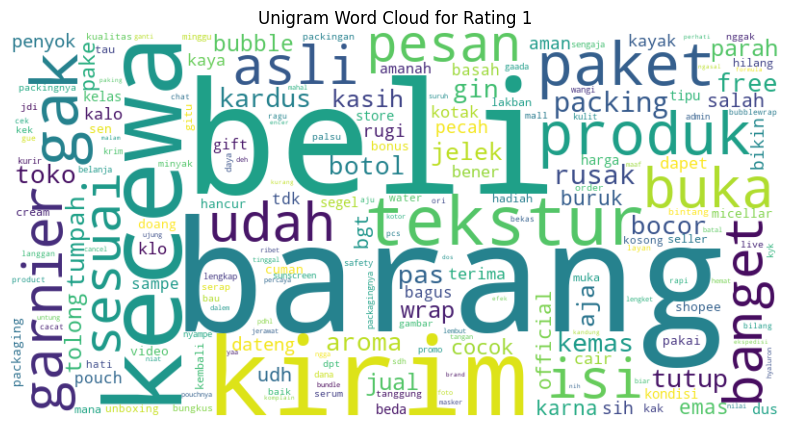

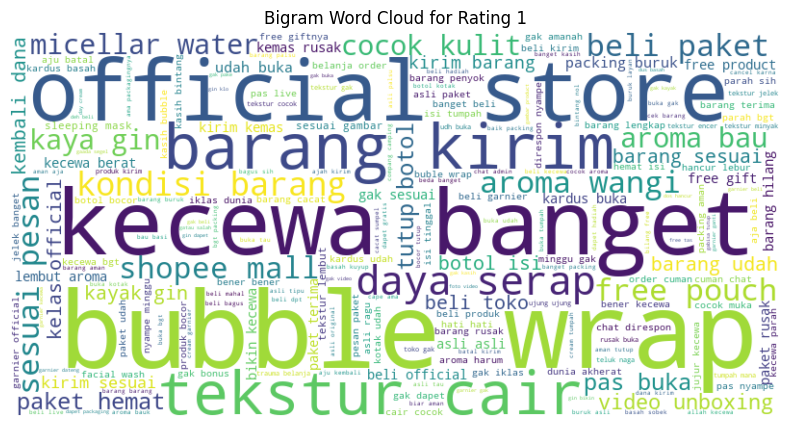

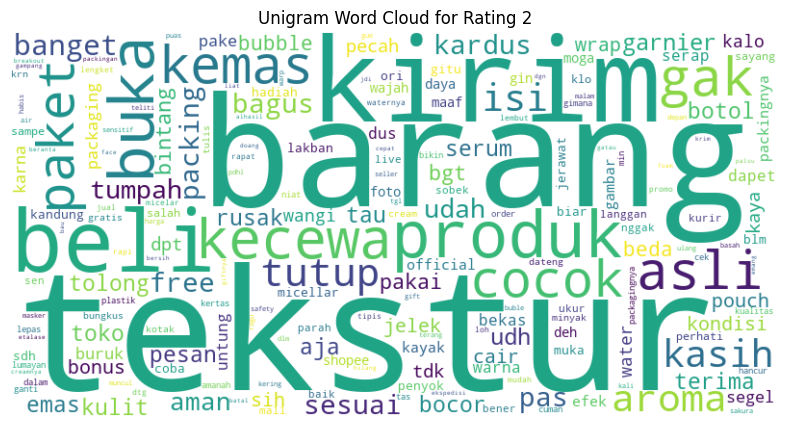

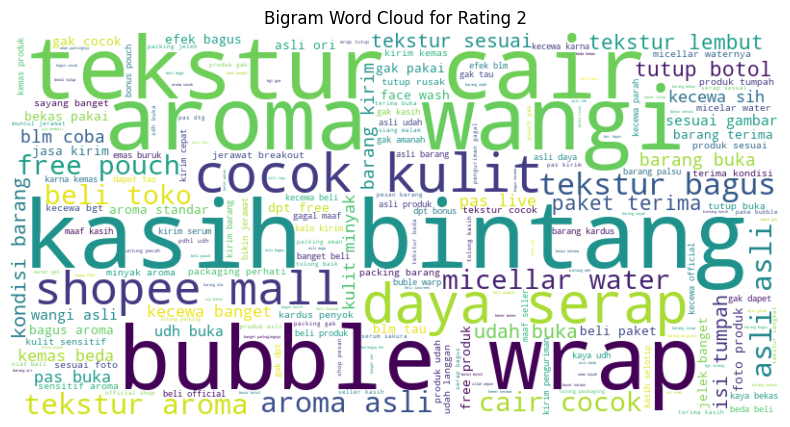

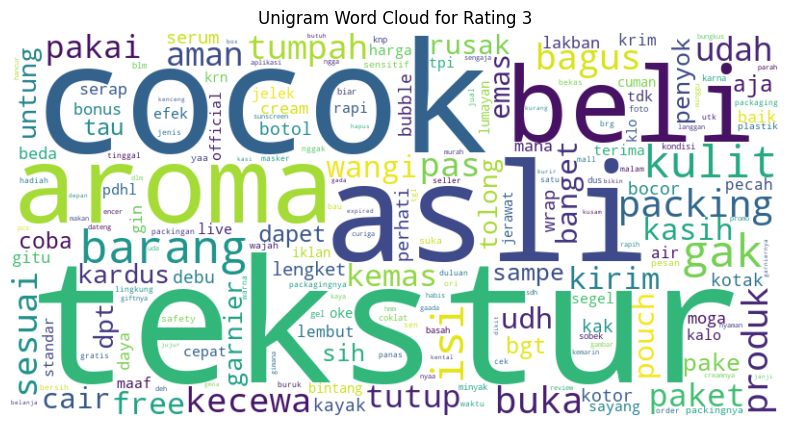

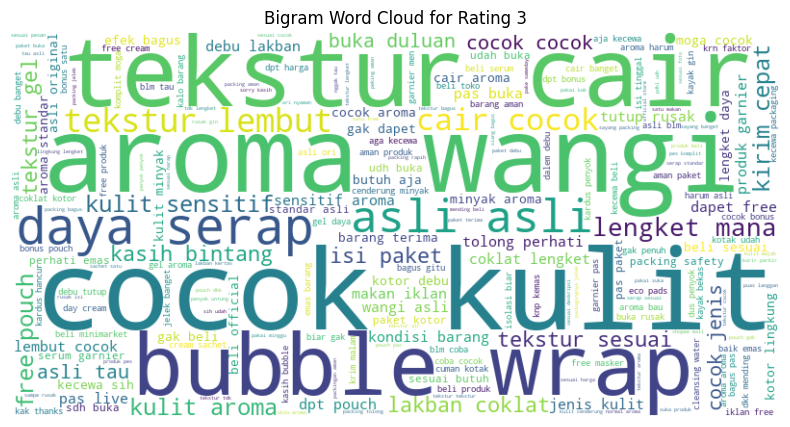

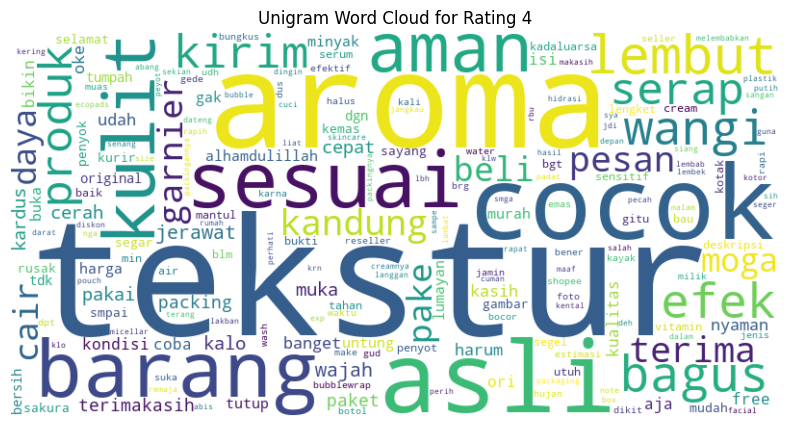

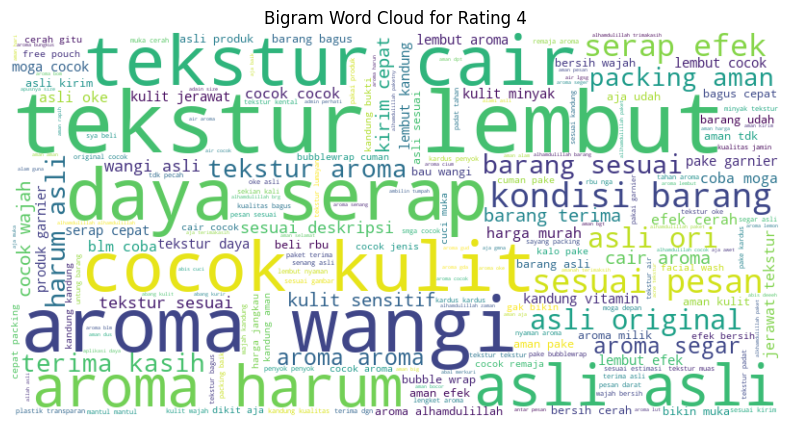

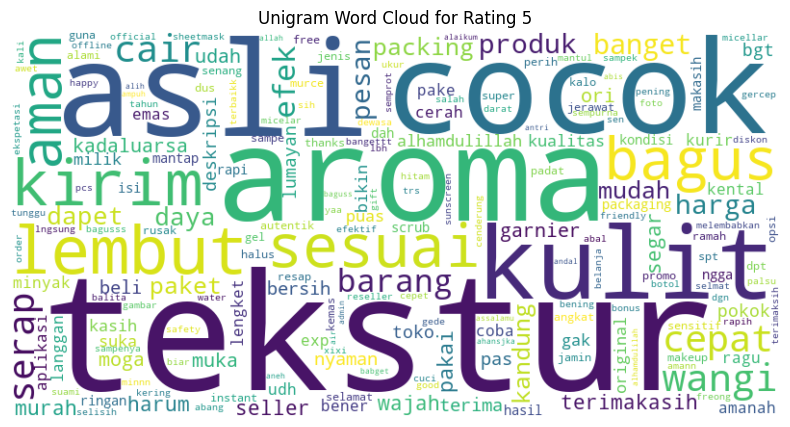

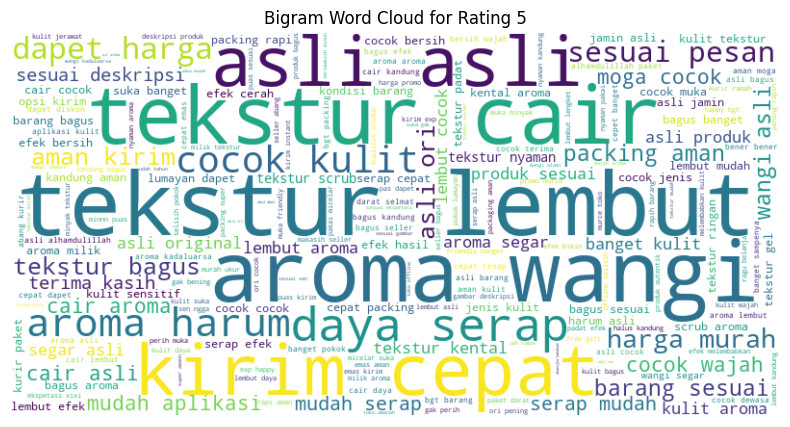

=========== Unigram Analysis ==============

for rating: 1
beli: 105 occurrences
barang: 102 occurrences
kirim: 90 occurrences
kecewa: 86 occurrences
tekstur: 75 occurrences
gak: 69 occurrences
paket: 58 occurrences
produk: 56 occurrences
buka: 48 occurrences
garnier: 48 occurrences

for rating: 2
tekstur: 100 occurrences
barang: 81 occurrences
kirim: 77 occurrences
beli: 73 occurrences
produk: 73 occurrences
buka: 67 occurrences
kecewa: 66 occurrences
gak: 62 occurrences
asli: 61 occurrences
kemas: 59 occurrences

for rating: 3
tekstur: 70 occurrences
cocok: 55 occurrences
asli: 43 occurrences
aroma: 42 occurrences
beli: 39 occurrences
barang: 33 occurrences
gak: 32 occurrences
isi: 31 occurrences
kulit: 31 occurrences
packing: 31 occurrences

for rating: 4
tekstur: 81 occurrences
aroma: 52 occurrences
cocok: 49 occurrences
asli: 46 occurrences
barang: 32 occurrences
sesuai: 31 occurrences
kulit: 26 occurrences
aman: 24 occurrences
lembut: 23 occurrences
bagus: 20 occurrences

for rat

In [ ]:
analyze_comment('msglow_comments.csv')

# Scarlett Comments

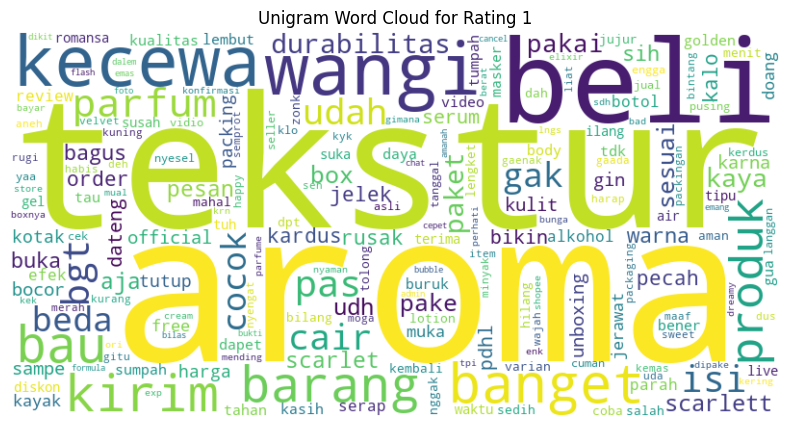

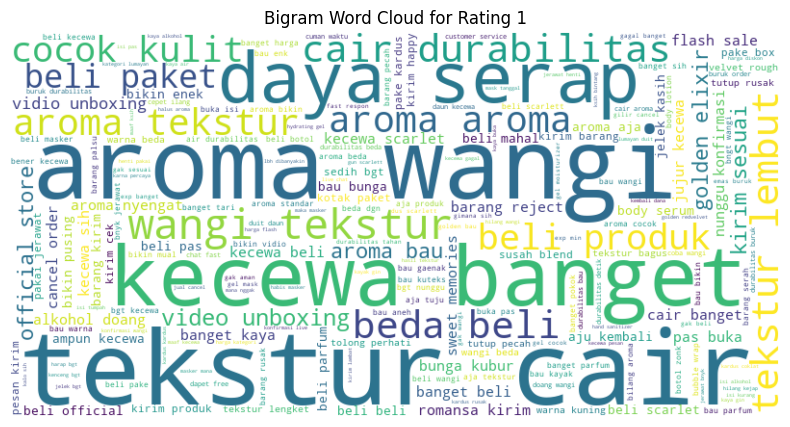

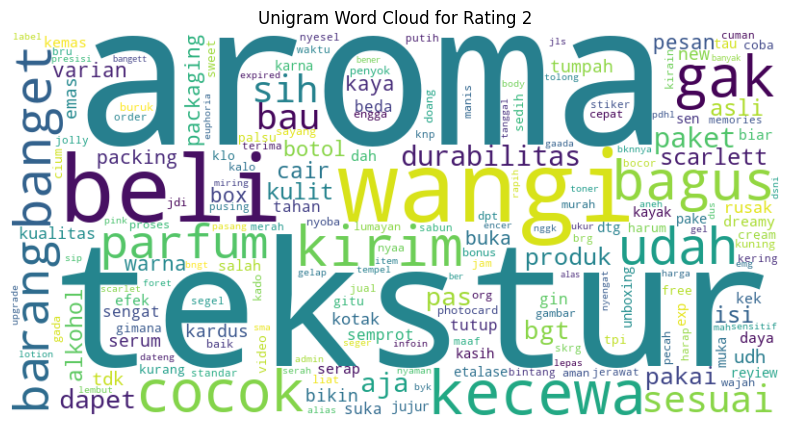

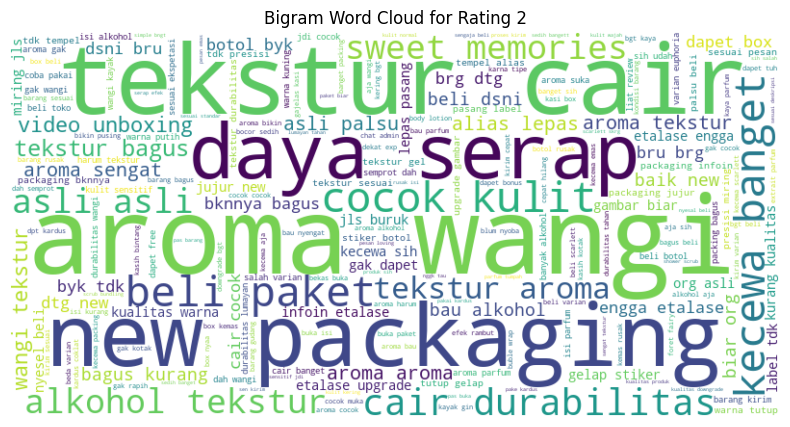

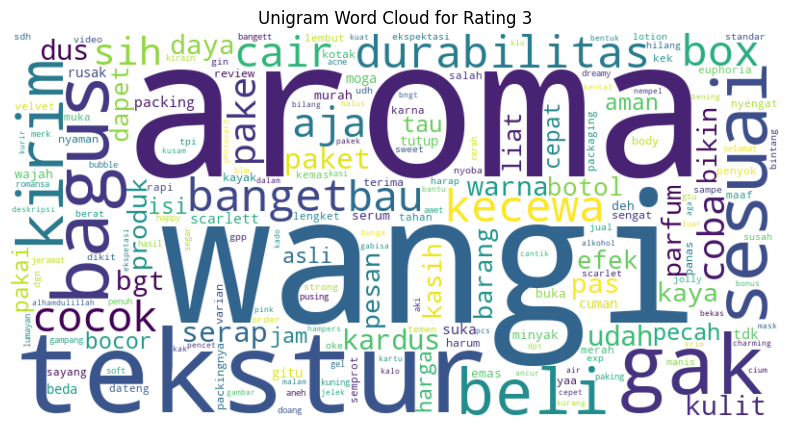

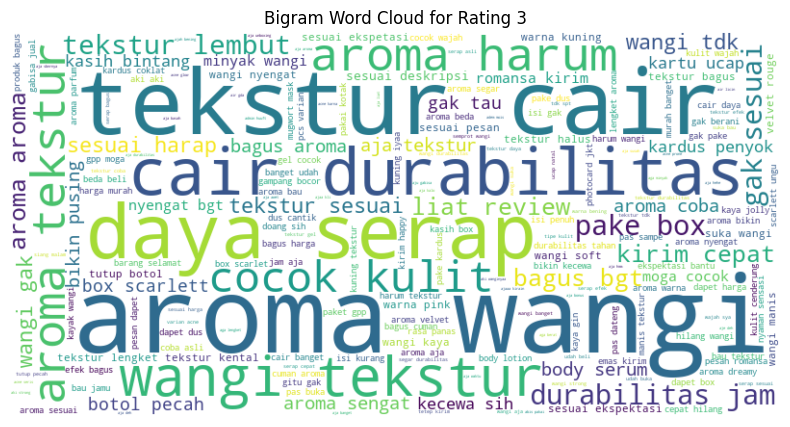

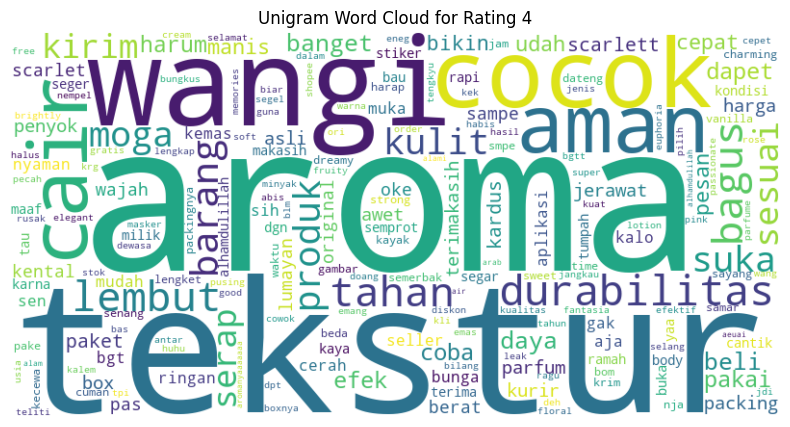

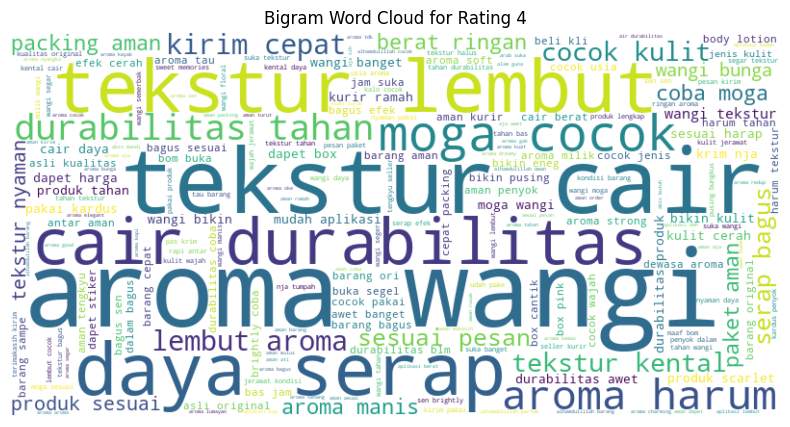

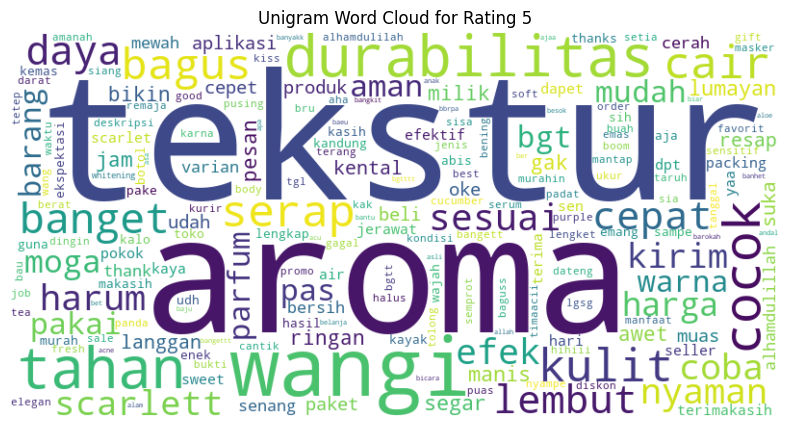

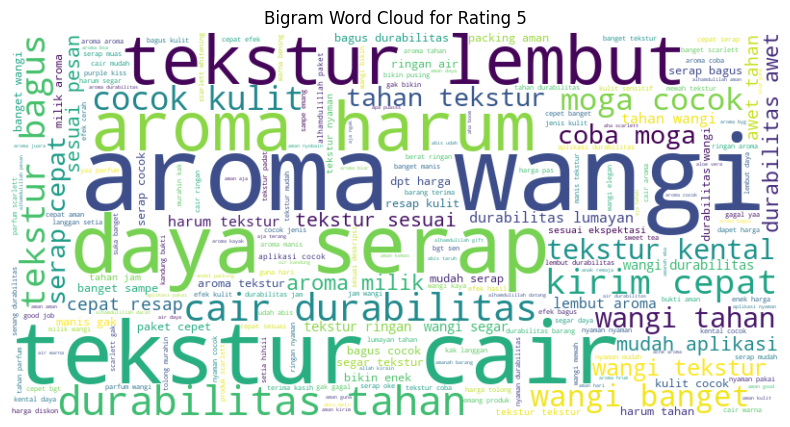

=========== Unigram Analysis ==============

for rating: 1
aroma: 108 occurrences
tekstur: 87 occurrences
beli: 85 occurrences
wangi: 72 occurrences
kecewa: 69 occurrences
banget: 52 occurrences
kirim: 47 occurrences
bau: 46 occurrences
barang: 45 occurrences
produk: 40 occurrences

for rating: 2
aroma: 95 occurrences
tekstur: 70 occurrences
wangi: 68 occurrences
beli: 59 occurrences
kecewa: 43 occurrences
cocok: 37 occurrences
gak: 37 occurrences
kirim: 36 occurrences
bagus: 33 occurrences
banget: 30 occurrences

for rating: 3
aroma: 104 occurrences
wangi: 87 occurrences
tekstur: 78 occurrences
gak: 35 occurrences
bagus: 31 occurrences
sesuai: 29 occurrences
beli: 28 occurrences
kirim: 28 occurrences
banget: 25 occurrences
durabilitas: 24 occurrences

for rating: 4
aroma: 76 occurrences
tekstur: 71 occurrences
wangi: 61 occurrences
cocok: 34 occurrences
aman: 24 occurrences
cair: 24 occurrences
durabilitas: 24 occurrences
bagus: 23 occurrences
lembut: 23 occurrences
tahan: 23 occurren

In [17]:
analyze_comment('scarlett_comments.csv')

# Skintific Comments

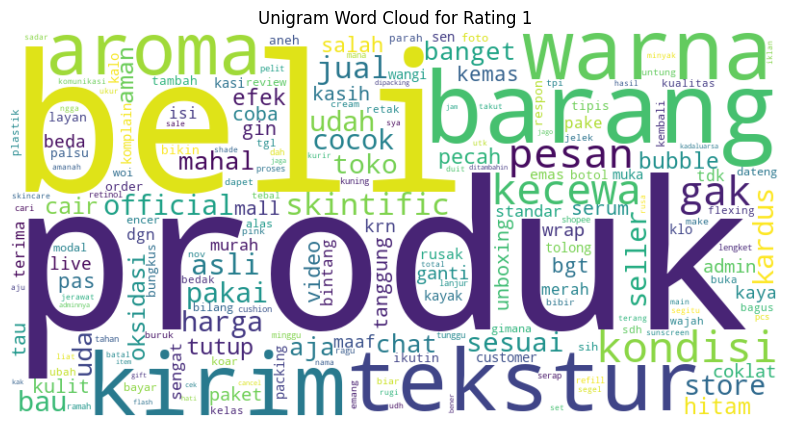

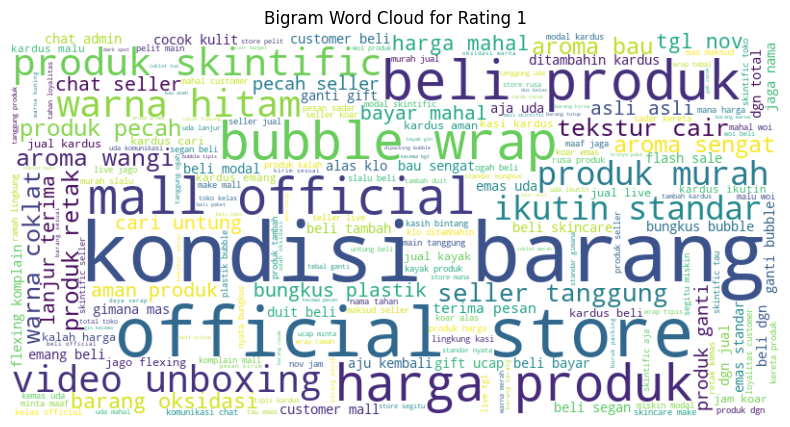

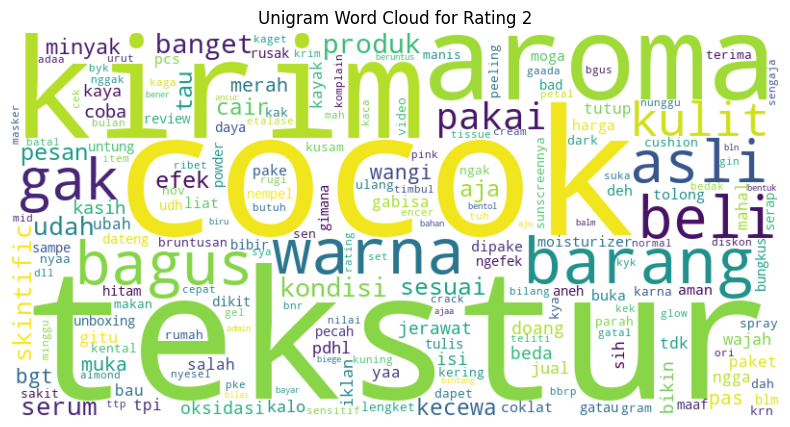

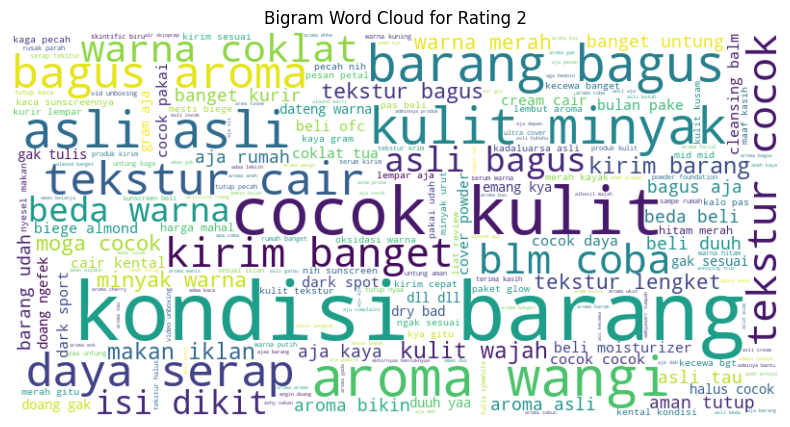

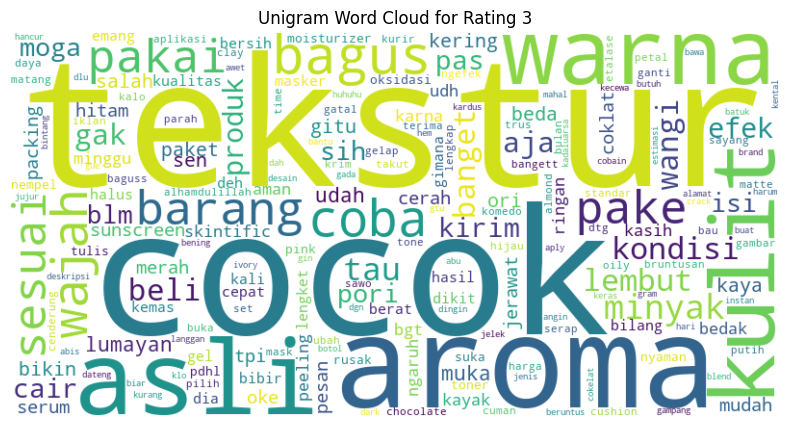

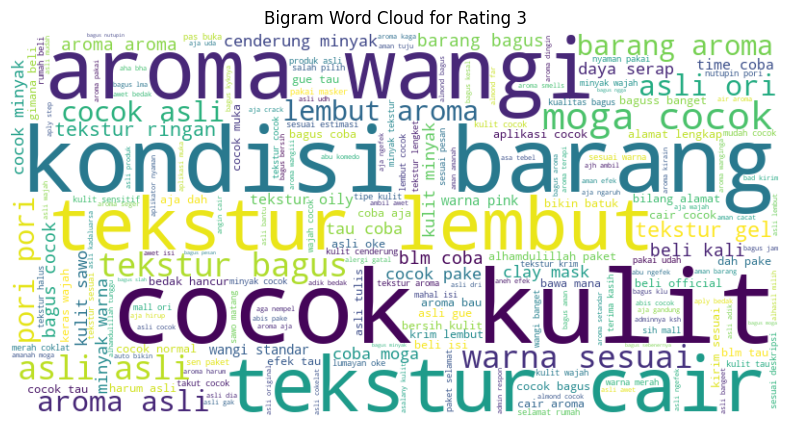

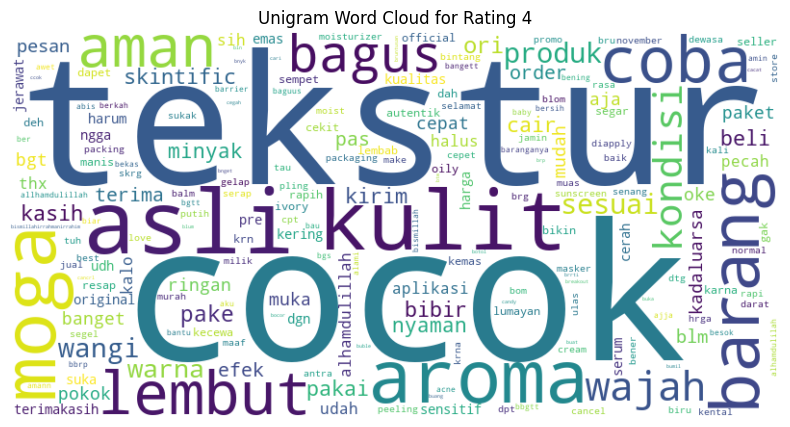

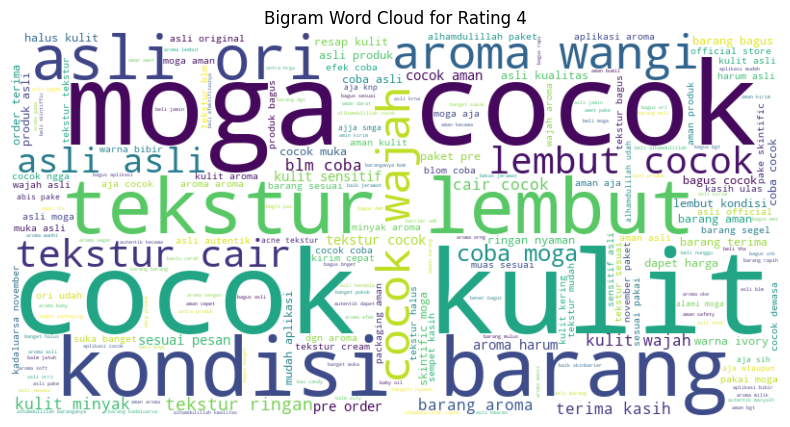

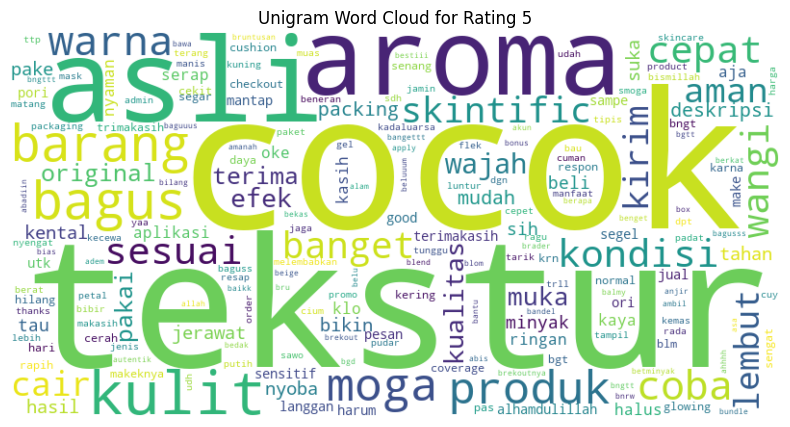

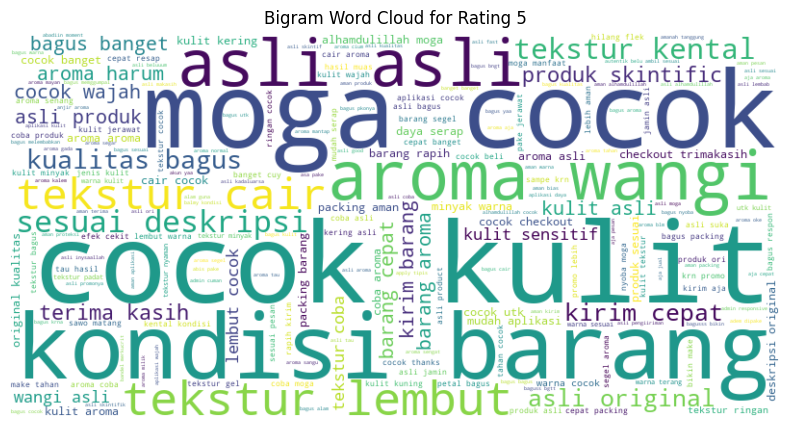

=========== Unigram Analysis ==============

for rating: 1
produk: 123 occurrences
beli: 111 occurrences
barang: 89 occurrences
kirim: 68 occurrences
tekstur: 65 occurrences
warna: 64 occurrences
aroma: 51 occurrences
kondisi: 50 occurrences
kecewa: 48 occurrences
pesan: 46 occurrences

for rating: 2
tekstur: 44 occurrences
cocok: 42 occurrences
kirim: 32 occurrences
aroma: 30 occurrences
barang: 30 occurrences
warna: 30 occurrences
bagus: 28 occurrences
asli: 26 occurrences
beli: 26 occurrences
gak: 25 occurrences

for rating: 3
tekstur: 72 occurrences
cocok: 68 occurrences
aroma: 33 occurrences
asli: 32 occurrences
warna: 32 occurrences
kulit: 30 occurrences
bagus: 25 occurrences
coba: 22 occurrences
wajah: 21 occurrences
barang: 19 occurrences

for rating: 4
cocok: 75 occurrences
tekstur: 68 occurrences
asli: 45 occurrences
kulit: 39 occurrences
aroma: 31 occurrences
moga: 31 occurrences
barang: 25 occurrences
coba: 22 occurrences
lembut: 19 occurrences
aman: 18 occurrences

for rat

In [18]:
analyze_comment('skintific_comments.csv')

# Somethinc Comments

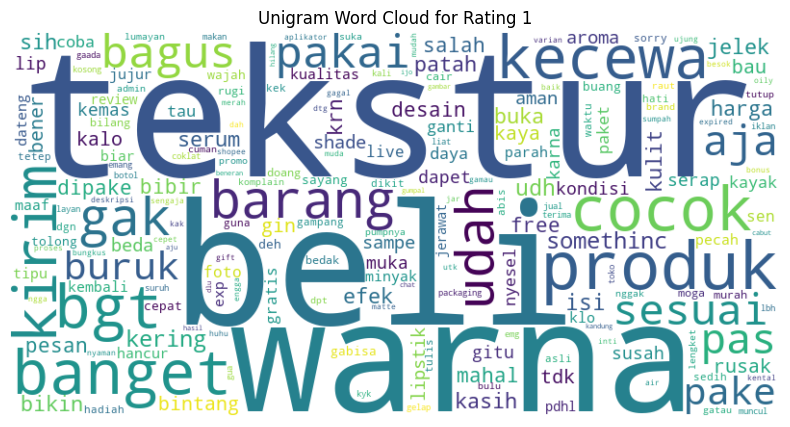

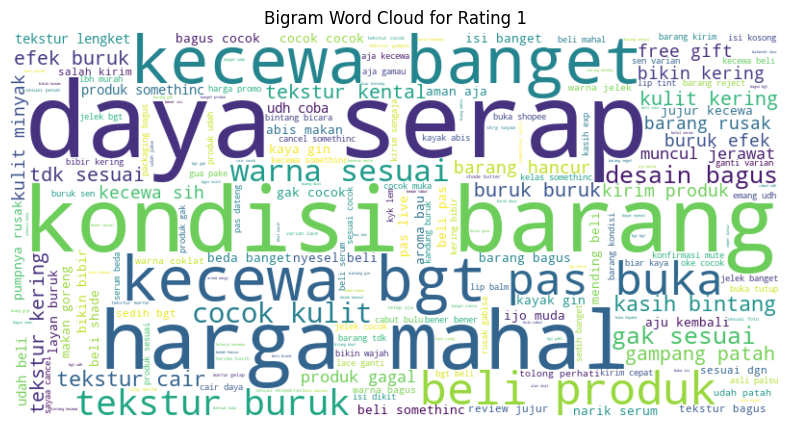

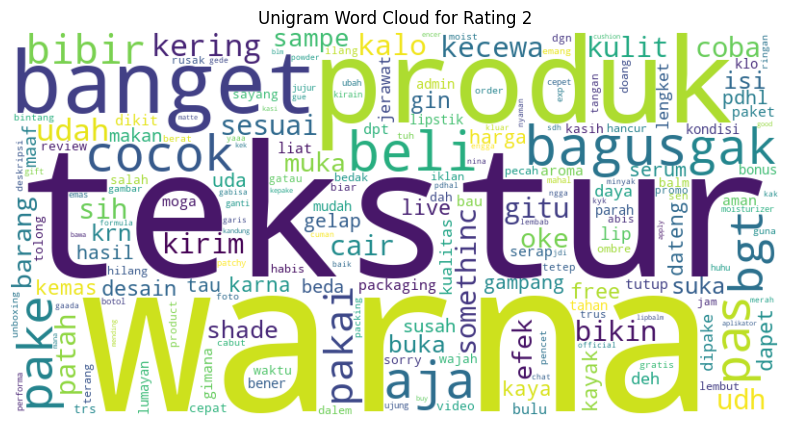

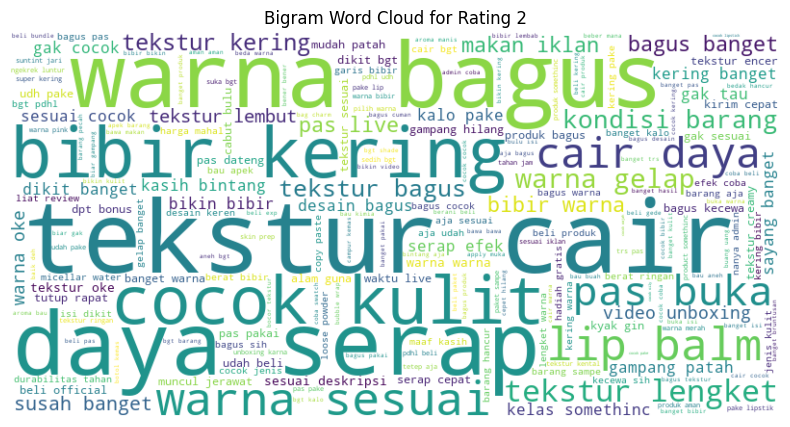

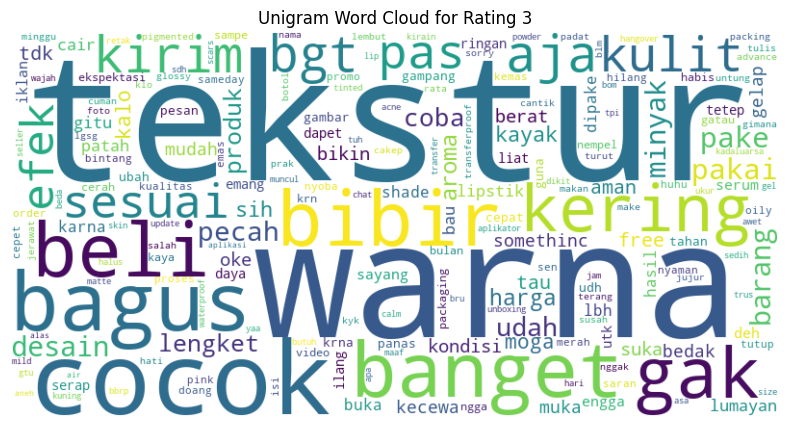

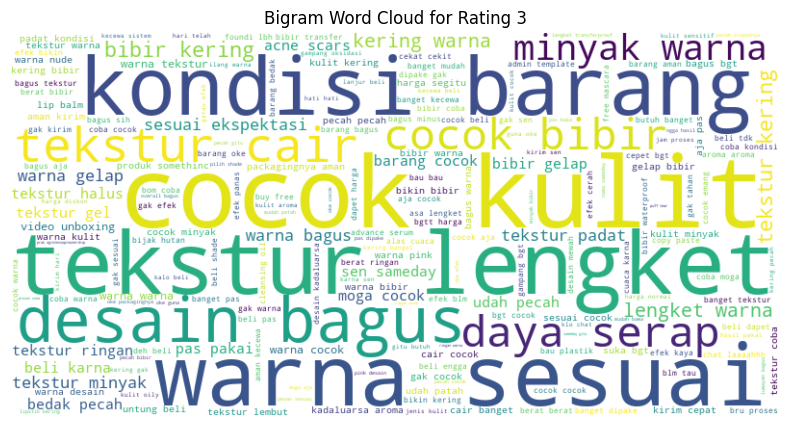

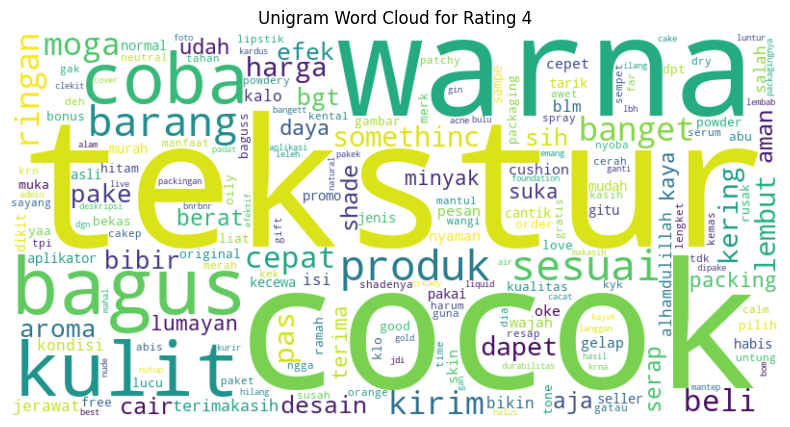

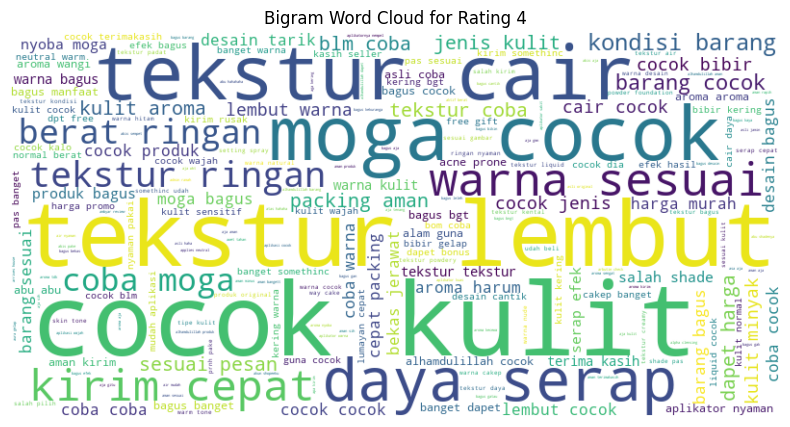

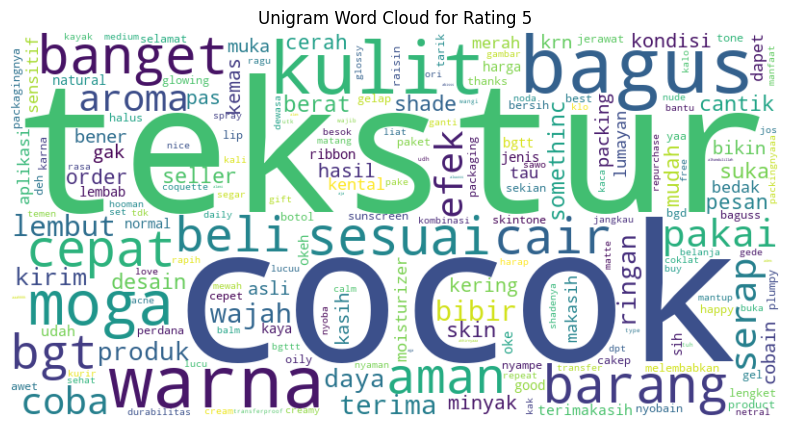

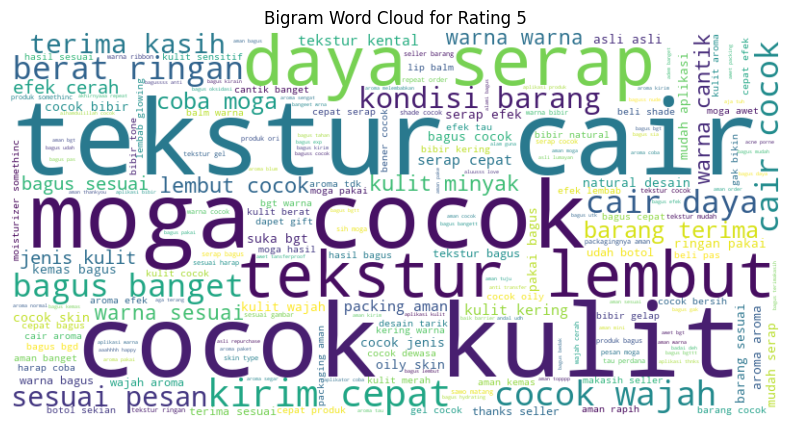

=========== Unigram Analysis ==============

for rating: 1
tekstur: 120 occurrences
beli: 109 occurrences
warna: 93 occurrences
produk: 80 occurrences
banget: 67 occurrences
cocok: 66 occurrences
bgt: 64 occurrences
kecewa: 64 occurrences
kirim: 64 occurrences
barang: 60 occurrences

for rating: 2
warna: 130 occurrences
tekstur: 125 occurrences
produk: 90 occurrences
banget: 88 occurrences
bagus: 84 occurrences
beli: 84 occurrences
aja: 75 occurrences
cocok: 68 occurrences
gak: 67 occurrences
pas: 67 occurrences

for rating: 3
tekstur: 115 occurrences
warna: 99 occurrences
cocok: 80 occurrences
bagus: 48 occurrences
banget: 48 occurrences
bibir: 48 occurrences
beli: 46 occurrences
gak: 41 occurrences
kering: 35 occurrences
aja: 34 occurrences

for rating: 4
tekstur: 87 occurrences
cocok: 82 occurrences
warna: 49 occurrences
bagus: 40 occurrences
kulit: 36 occurrences
coba: 32 occurrences
produk: 23 occurrences
sesuai: 23 occurrences
barang: 22 occurrences
banget: 21 occurrences

for ra

In [19]:
analyze_comment('somethinc_comments.csv')